#**End to end multi-class Dog Breed Classisication**

this notebook builds an end to end multi class image classifier using Tensorflo 2.0 and Tensor Hub.

##1.Problem
Identifying the bread of a dog given an image of a dog.
##2.Data
The data is from kaggle's dog breed identification competetion.

https://www.kaggle.com/c/dog-breed-identification/data

##3.Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

##4.Features
Some information about the data:
.We are dealing with images(unstructured data) so it is probably best we use deep learning/transfer learning.

.There are 120 breeds of dogs (this means there are 120 different classes).

.There are around 10000+ images in the training set(these images have labels).

.there are around 10000+ images in the test set(these images have no labels,beacuse we'll want to prfedict them).



###Get the work space ready
.import tensorflow

.import tensorflow hub

.Make sure of using GPU

In [4]:
# Importing tensor flow
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)

#check for GPU availability
print("GPU","available(Yess!)" if tf.config.list_physical_devices("GPU") else "not available")


2.18.0
0.16.1
GPU available(Yess!)


In [5]:
from google.colab import files      #choose kaggle.json api downloaded from kaggle website
uploaded=files.upload()

Saving kaggle.json to kaggle.json


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
import os
os.makedirs('/root/.kaggle',exist_ok=True)
!mv kaggle.json /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [8]:
!kaggle competitions download -c dog-breed-identification

In [9]:
!unzip dog-breed-identification.zip -d dog_breed_data

Streaming output truncated to the last 5000 lines.
  inflating: dog_breed_data/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: dog_breed_data/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: dog_breed_data/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: dog_breed_data/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: dog_breed_data/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: dog_breed_data/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: dog_breed_data/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: dog_breed_data/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: dog_breed_data/train/83fad0718581a696132c96c166472627.jpg  
  inflating: dog_breed_data/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: dog_breed_data/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: dog_breed_data/train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: dog_breed_data/train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  


##getting our data ready(turning into tensors)
With all machine learning models,our data has to be in numerical format.So thats what we will be doing first.Turning our images into Tensors(numerical representations)

In [10]:
#check the labels of the our data
import pandas as pd
labels_csv=pd.read_csv("/content/dog_breed_data/labels.csv")
print(labels_csv.describe())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

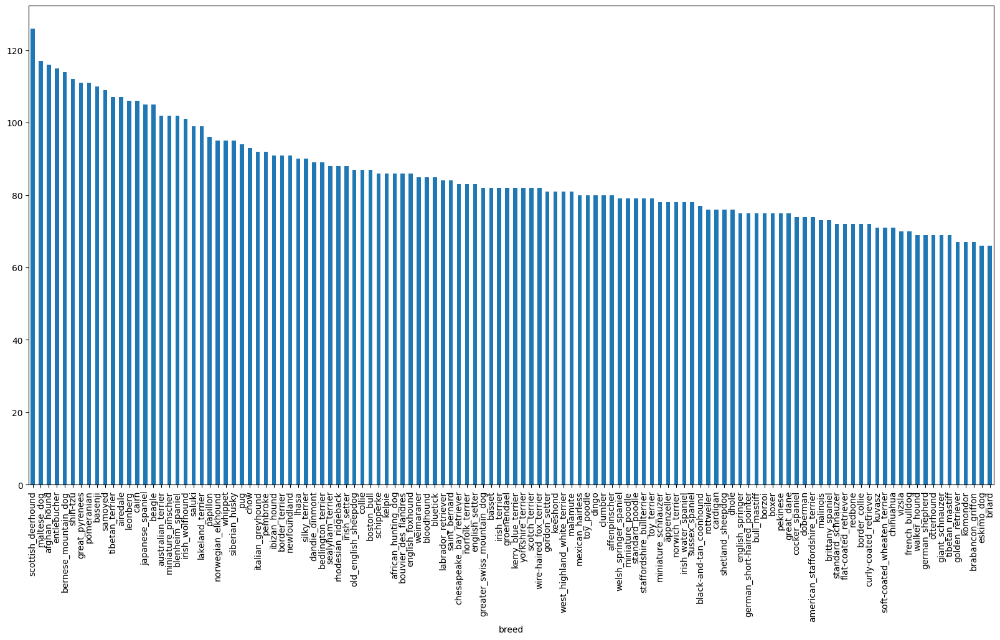

In [12]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [13]:
#median number of images per class
labels_csv["breed"].value_counts().median()

82.0

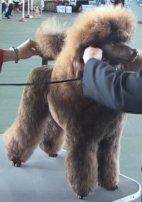

In [14]:
#Lets view an image
from IPython.display import Image
Image("/content/dog_breed_data/test/00225dcd3e4d2410dd53239f95c0352f.jpg")

###Getting images and their labels
lets get a list of all of  our image pathnames

In [15]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [16]:
#create pathnames from image id
filenames=["/content/dog_breed_data/train/" + fname +".jpg"for fname in labels_csv["id"]]
filenames[:15]

['/content/dog_breed_data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/dog_breed_data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/dog_breed_data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/dog_breed_data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/dog_breed_data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/dog_breed_data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/dog_breed_data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/dog_breed_data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/dog_breed_data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/dog_breed_data/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/dog_breed_data/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/dog_breed_data/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/dog_breed_data/train/00693b8bc2470375cc744a6391d397ec.jpg',
 '/content/dog_breed_data/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 '/con

In [17]:
#check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/dog_breed_data/train/"))==len(filenames):
  print("OFF course matcheed!")

OFF course matcheed!


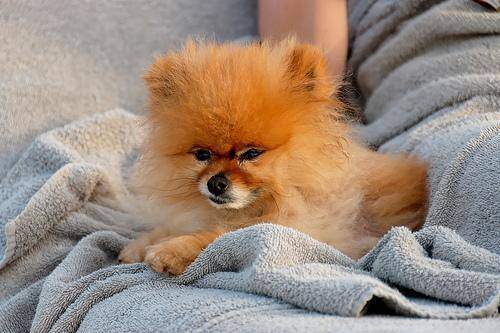

In [18]:
Image(filenames[8000])

In [19]:
labels_csv["breed"][8000]

'pomeranian'

We got training image filepaths in a list.lets prepare our labels

In [20]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [21]:
if len(labels)==len(filenames):
  print("number of labels matches file name")

number of labels matches file name


In [22]:
#Find the unique label values
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [23]:
len(unique_breeds)

120

In [24]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [25]:
#Turn every label into boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
#Example:Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0]))#index where label occurs
print(boolean_labels[0].argmax())#index where label occurs in boolean array
print(boolean_labels[0].astype(int))#there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


 ##Creating our own validation set


 since the dataset from kaggle doesnt come with a validation set,we are going to create our own.

In [27]:
#setup x&y variables

x=filenames
y=boolean_labels

We are going to start off experimenting with ~1000 images and increase as needed

In [28]:
#Set number of images to use for experimenting
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:11000}

In [29]:
#Lets split the data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=20)
len(x_train),len(y_train),len(x_val),len(y_val)


(800, 800, 200, 200)

###Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we are going to write a function which does few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and
   save it to a variable,image
3. Turn our image into tensors
4. Normalize our image(convert colour channel values from 0-255 to 0-1)
5. Resize the image to be shape of(224,
  224)
6. Return the modified image

In [30]:
#Convert image to NUmpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [31]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [32]:
import tensorflow as tf
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

we have seen what an image looks like as a Tensor,lets make a function to preprocess them.

In [33]:
#Define image size
IMG_SIZE=224

#create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.

  """
#Read in an image file
  image=tf.io.read_file(image_path)

#Turn the jpeg image into numerical Tensor with 3 colour channels(Red,Green,Blue)
  image=tf.image.decode_jpeg(image,channels=3)

  #convert the color channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)

  #Resize the image to our desired value(224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

In [34]:
tensor=tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [35]:
tf.image.decode_jpeg(tensor,channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

###Turning our data into batches
why turn our data into batches?

if we try to process 10,000+ images in one go.....they all might not fit into memory.

So thats why we do about 32(this is the batch size) images at a time(you can manually adjust the batch)
In order to use TensorFlow effecticely,we need our data in the form of Tensor tuples which look like:'(image,label)'

In [36]:
#Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """Takes image file path names and the associated label,
     process the image and returns a type of (image,label)."""
  image=process_image(image_path)
  return image,label

In [37]:
(process_image(x[40]),tf.constant(y[40]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.99609005, 0.96119833, 0.95770377],
         [0.98501533, 0.94666374, 0.93379605],
         [0.99749774, 0.9770274 , 0.9565523 ],
         ...,
         [0.34569168, 0.5497533 , 0.22850783],
         [0.4276134 , 0.6322353 , 0.33483163],
         [0.36833197, 0.5772412 , 0.29097825]],
 
        [[0.9687435 , 0.965289  , 0.9172323 ],
         [0.94134724, 0.93233955, 0.8760108 ],
         [0.92182285, 0.9180851 , 0.8512452 ],
         ...,
         [0.36644298, 0.57037514, 0.24943131],
         [0.36225268, 0.5662274 , 0.2703323 ],
         [0.34930357, 0.5534058 , 0.27435333]],
 
        [[0.82989013, 0.87487435, 0.75133675],
         [0.7506709 , 0.7958162 , 0.66784185],
         [0.75523835, 0.8078179 , 0.67545015],
         ...,
         [0.40426058, 0.60512996, 0.2932135 ],
         [0.35947898, 0.55773896, 0.2682605 ],
         [0.38644102, 0.5856088 , 0.3115852 ]],
 
        ...,
 
        [[0.45484307, 0.5300532 

Now we got a way to turn data into tuples of Tensors in the form: `(image,label)`,let us make a function to turn all the data into batches!


In [38]:
#Define the batch size,32 is a good start
BATCH_SIZE=32

#create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """Creates batches of data out of image x and label y pairs.
     shuffles the data if it is training data but doesn't shufflew if it validation data.
     Also accepts test data as input(no labels).
     """
  #if the data is  a test dataset,we dont have labels
  if test_data:
    print("creating test data batches......")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only filepaths (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  #if the data is a valid dataset,we dont need to shuffle it
  elif valid_data:
    print("Creating valid data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),#File paths
                                             tf.constant(y))) #labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches....")
    #Turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffle
    data=data.shuffle(buffer_size=len(x))

    #create (image,label) tuples (this also turns the image path into a preprocessed image)
    data=data.map(get_image_label)

    #Turn the training data into batches

    data_batch=data.batch(BATCH_SIZE)

  return data_batch


In [39]:
#Create training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches....
Creating valid data batches....


In [40]:
#Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

##Visualizing data batches
Our data is now in batches,however,these can be a little hard to understtand/comprehend,lets visualize the batches

In [41]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  #Setup the figure
  plt.figure(figsize=(10,10))

  #Loop through 25(for displaying 25 images)
  for i in range(25):
    #Create subplots (5rows,5columns)
    ax=plt.subplot(5,5,i+1)

    #Display an image
    plt.imshow(images[i])

    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

In [42]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [43]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[2.52792388e-01, 2.21463606e-01, 2.31906533e-01],
          [4.31654125e-01, 4.19388354e-01, 4.40485001e-01],
          [5.77564836e-01, 5.84392548e-01, 6.09375000e-01],
          ...,
          [1.09314740e-01, 1.25001013e-01, 1.36765718e-01],
          [1.01094112e-01, 1.16780385e-01, 1.28545076e-01],
          [9.95448232e-02, 1.15231097e-01, 1.26995802e-01]],
 
         [[2.45849445e-01, 2.31616259e-01, 2.35932440e-01],
          [4.24798727e-01, 4.23651993e-01, 4.33355123e-01],
          [5.77564836e-01, 5.86486340e-01, 6.05863094e-01],
          ...,
          [1.03005789e-01, 1.18692063e-01, 1.30456761e-01],
          [9.74506140e-02, 1.13136888e-01, 1.24901593e-01],
          [9.74439904e-02, 1.13130264e-01, 1.24894969e-01]],
 
         [[2.72155136e-01, 2.67479599e-01, 2.70500720e-01],
          [4.49497610e-01, 4.53419179e-01, 4.61262316e-01],
          [5.91509163e-01, 6.02844834e-01, 6.13159359e-01],
          ...,
          [1.08884715e-01, 1.23625606e-01, 1.3570

In [44]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [45]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

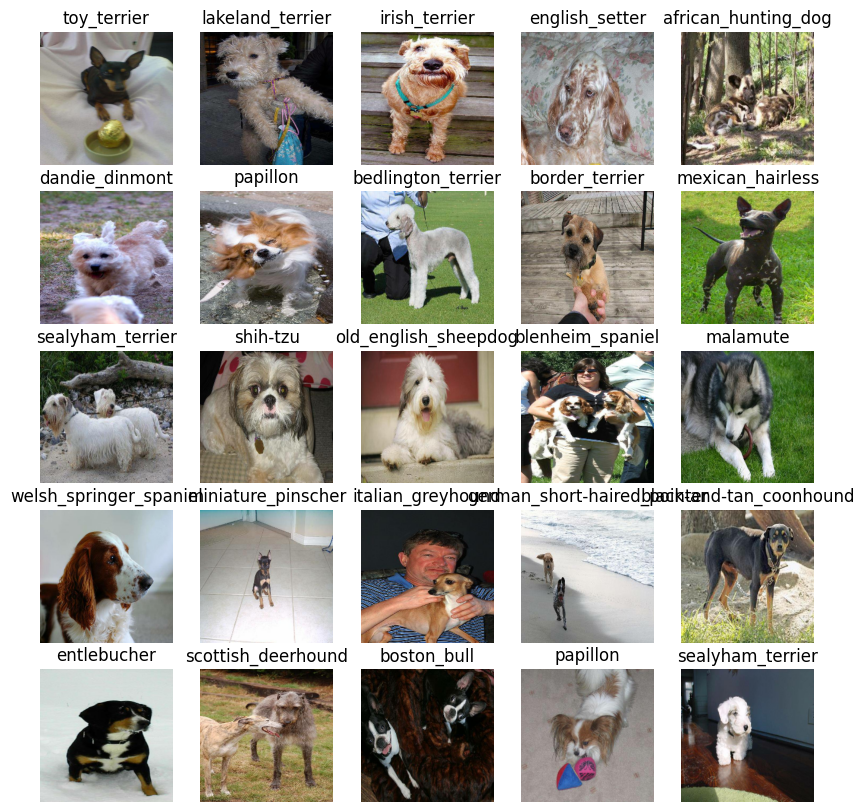

In [46]:
#Now lets visualize the data in a training batch
show_25_images(train_images,train_labels)


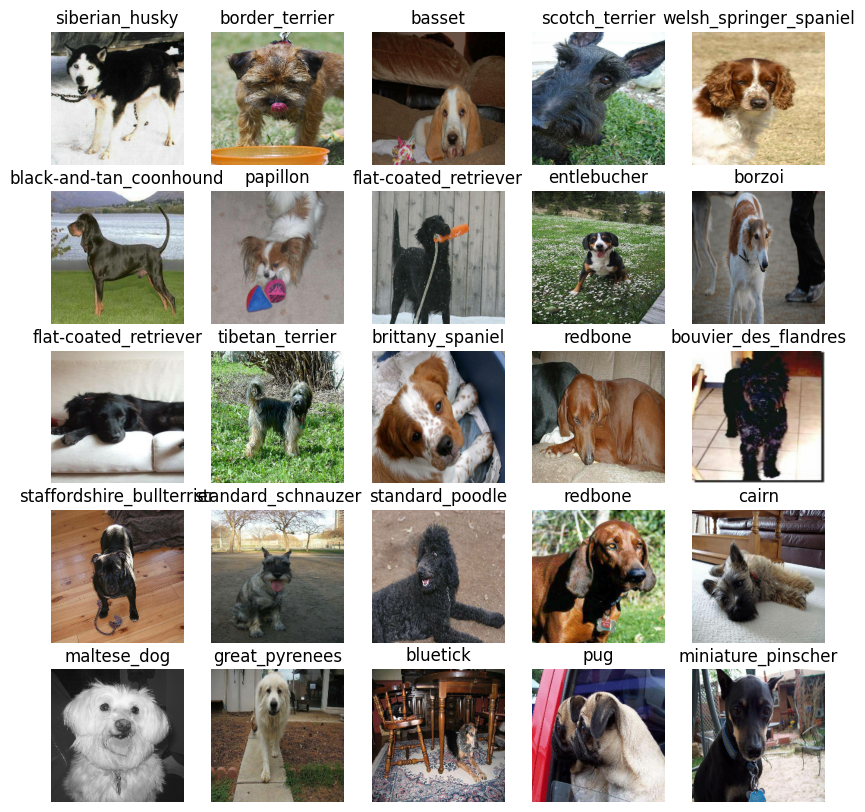

In [47]:
#Now lets visualize the data in a training batch
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

# Building a model
Before we build a model,there are few things we need to define:
*The input shape(our images shape,in the form of Tensors) to our model.
*The output shape(image labels,in the form of Tensors) of our model.
*The URL of the model we want to use.

In [48]:
#Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]  #batch,height,width,colour channels

#Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#Setup model URL from TensorFlow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"



#Now we got our inputs,outputs and model ready to go.
Lets put them together into a keras deep learning model!

Knowing this,lets create a funcion which:
*Takes the input shape,output shape and the model we have choosen as parameters.

*Defines the layers in a keras model in sequential fashion(do this first,then this,then that).

*Compiles the model (says it should be evaluated and improved).

*Builds the model(tells the model the input shape it will be getting).

*Returns the model.

All of these steps can be found at https://www.tensorflow.org/guide/keras/overview


In [49]:
from tensorflow.keras import layers
#Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with :",MODEL_URL)

  #setup the model layers
  model=tf.keras.Sequential([
      hub.keras_layer.KerasLayer(MODEL_URL), #Layer 1(input_layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
      activation="softmax") #Layer2(output layer)
  ])

#compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizer.Adam(),
      metrics=["accuracy"]
)


#Build the model
  model.build(INPUT_SHAPE)

  return model

In [50]:
import tensorflow as tf
import tensorflow_hub as hub

def create_model(input_shape=[224, 224, 3], output_shape=1001, model_url="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"):
    print("Building model with:", model_url)

    # Setup the model layers
    model = tf.keras.Sequential([
        # Explicitly define an input layer with the correct shape
        tf.keras.layers.InputLayer(input_shape=input_shape),

        # Load the TF Hub model - wrapping it in a Lambda layer to avoid compatibility issues
        tf.keras.layers.Lambda(
            lambda x: hub.load(model_url)(x)
        ),

        # Add a classification layer
        tf.keras.layers.Dense(units=output_shape, activation="softmax")  # Output layer
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model
    model.build([None] + input_shape)

    return model

In [51]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                 │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1001)           │     1,666,665 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,666,665 (6.36 MB)

 Trainable params: 1,666,665 (6.36 MB)

 Non-trainable params: 0 (0.00 B)

In [52]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers

def create_model(input_shape=[224, 224, 3], output_shape=120, model_url="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"):
    print("Building model with:", model_url)

    # Define inputs explicitly
    inputs = tf.keras.Input(shape=input_shape)

    # Use the hub module in a Lambda layer for better compatibility
    hub_layer = hub.load(model_url)
    x = tf.keras.layers.Lambda(lambda x: hub_layer(x))(inputs)

    # Add classification layer
    outputs = tf.keras.layers.Dense(units=output_shape, activation="softmax")(x)

    # Create the model using the functional API
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

In [53]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_1 (Lambda)               │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 120)            │       199,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 199,800 (780.47 KB)

 Trainable params: 199,800 (780.47 KB)

 Non-trainable params: 0 (0.00 B)

##Creating  callbacks

callbacks are helper functions a model can use during training to do such things as save its progress,check its progress or stop training early if a model stops improving

Here we'll create two callbacks,one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

###TensorBoard callback
To setup a TensorBoard callback,we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a Tensorboard callback which is able to save logs to a directory and pass it to our models `fit()` function.

3. Visualize our models training logs with the %tensorboard magic function(we,ll do this after model training).

In [54]:
#load Tensorboard notebook extension
%load_ext tensorboard

In [55]:
import datetime
#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/MyDrive/Dog_vision/logs",
                     #Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


###EarlyStopping callback

Early stopping helps stop our model from overfitting by stopping training if a evaluation metrics stops
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [56]:
#Create early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

##Training a model(on subset of data)
Our first model is only going on train on 1000 images, to make sure everything is working.

In [57]:
NUM_EPOCHS=100 #@param{type:"slider",min:1,max:100,step:10}

Lets create a function which trains a model.

.Create a model using create_model()

.Setup a TensorBoard callback using create_tensorboard_callback()

.Call the fit() function on our model passing it the training data,validation data,number of epochs to train

.Return the model

In [58]:
#Build the function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  #create a model
  model=create_model()

  #Create new TensorBoard session every time we train a model
  tensorboard=create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,
            validation_freq=1,callbacks=[tensorboard,early_stopping])
  #Return the fitted model
  return model


In [59]:
#Fit the model to the data
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/callbacks/tensorboard.py:680: UserWarning: Model failed to serialize as JSON. Ignoring... Cannot serialize object <tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject object at 0x79f878374bd0> of type <class 'tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject'>. To be serializable, a class must implement the `get_config()` method.
  warnings.warn(f"Model failed to serialize as JSON. Ignoring... {exc}")


25/25 ━━━━━━━━━━━━━━━━━━━━ 24s 508ms/step - accuracy: 0.0771 - loss: 4.6347 - val_accuracy: 0.3150 - val_loss: 3.2470
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - accuracy: 0.7493 - loss: 1.7222 - val_accuracy: 0.5350 - val_loss: 1.9983
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.9485 - loss: 0.5578 - val_accuracy: 0.6000 - val_loss: 1.5857
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9909 - loss: 0.2722 - val_accuracy: 0.6150 - val_loss: 1.4431
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.9959 - loss: 0.1688 - val_accuracy: 0.6200 - val_loss: 1.4311
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.9972 - loss: 0.1162 - val_accuracy: 0.6300 - val_loss: 1.3956
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 1.0000 - loss: 0.0906 - val_accuracy: 0.6350 - val_loss: 1.3546
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 1.0000 - loss: 0.0668 - val_accuracy: 0.6300 - v

It looks like our model is overfitting because its performing far better on the training dataset than thevalidation dataset,What are some ways to prevent model overfitting in deep learning neural networks?

##Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [60]:
%tensorboard --logdir drive/MyDrive/Dog_vision/logs

<IPython.core.display.Javascript object>

Making and evaluating predictions using a trained model

In [61]:
#Make predictions on the validation data(not used to train on)
predictions=model.predict(val_data,verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 483ms/step


array([[7.57160378e-05, 5.43313741e-04, 1.92520639e-03, ...,
        6.11551618e-03, 1.16975082e-03, 3.65897286e-04],
       [3.26805857e-05, 6.73998584e-05, 5.05822281e-05, ...,
        5.91810749e-05, 9.24501910e-06, 5.33227103e-05],
       [4.53910120e-02, 1.62837026e-03, 5.84254740e-05, ...,
        4.05213141e-05, 6.52446829e-07, 7.42719800e-04],
       ...,
       [1.36191596e-03, 1.49736763e-04, 6.36058219e-04, ...,
        5.15917345e-05, 8.01769511e-06, 1.12838876e-04],
       [6.17900296e-05, 9.04839694e-01, 6.09419185e-05, ...,
        2.15400141e-04, 2.48724846e-05, 2.57703266e-03],
       [7.51147309e-05, 3.54608819e-05, 1.21957483e-03, ...,
        5.39981876e-04, 8.57209379e-04, 2.76850595e-04]], dtype=float32)

In [62]:
predictions.shape

(200, 120)

In [63]:
len(y_val),len(unique_breeds)

(200, 120)

In [64]:
np.sum(predictions[190])

np.float32(1.0)

In [65]:
#First prediction
index=99
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[9.6161962e-03 6.5477652e-04 1.1147384e-03 4.0128933e-05 2.5059677e-05
 5.8211199e-06 5.7593226e-01 4.4804098e-04 7.1939707e-05 4.1849558e-05
 3.6783735e-05 4.1206833e-05 4.6940273e-05 1.1609223e-04 2.5386154e-04
 2.4297430e-04 3.0986830e-05 6.9163687e-04 3.7144040e-05 8.8805309e-04
 1.2027017e-04 7.4579584e-05 1.0669999e-04 9.1774482e-04 1.7428647e-05
 4.3911990e-05 2.3567469e-01 8.5482554e-04 1.8462919e-04 3.4550217e-03
 3.0117293e-04 9.8054508e-05 5.7956227e-06 4.0905058e-04 5.1682928e-05
 2.2511014e-03 3.2613645e-04 4.0398031e-03 6.8626140e-04 1.5676100e-05
 7.4912190e-05 2.9477800e-05 4.5527645e-06 1.1913038e-05 6.4317799e-05
 8.5428561e-05 7.7434536e-04 6.3392428e-05 2.2890633e-04 3.3431883e-05
 6.5047730e-05 3.6690963e-05 5.6988065e-04 5.1349311e-06 1.0678961e-03
 1.9829624e-04 4.0502689e-04 4.1111605e-03 6.7954265e-05 3.6583717e-03
 3.3447225e-04 2.0786717e-04 6.1555655e-04 2.2572378e-04 4.6633737e-05
 4.5711966e-04 8.9976871e-05 1.2762744e-04 2.0610609e-04 2.7013715e-05
 2.146

In [66]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

it would be even better if we could see the image the prediction is being made on!
**NOTE**:Prediction probabilities are also known as confidence levels.

In [67]:
#Turn prediction probabilities into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[120])
pred_label


'scotch_terrier'

Now since our validation data is still in a batch dataset,we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [68]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [69]:
#Create a function to unbatch the dataset.
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays of images and labels.
  """
  images=[]
  labels=[]
  #Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#Unbatchify the validation dataset
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.01162332, 0.0273096 , 0.03123116],
         [0.02332332, 0.04187199, 0.05151835],
         [0.02196254, 0.052486  , 0.06372549],
         ...,
         [0.01810224, 0.04163165, 0.03378852],
         [0.01418067, 0.03771009, 0.02202381],
         [0.01418067, 0.03771009, 0.02202381]],
 
        [[0.00582983, 0.02151611, 0.02543768],
         [0.0174895 , 0.03603817, 0.04568453],
         [0.0198617 , 0.05038516, 0.06162465],
         ...,
         [0.0243784 , 0.04790781, 0.04006467],
         [0.01870937, 0.04223878, 0.03140821],
         [0.01628151, 0.03981093, 0.02412465]],
 
        [[0.01335784, 0.02904412, 0.03296569],
         [0.0278799 , 0.04642858, 0.05607494],
         [0.03275561, 0.06327906, 0.07451856],
         ...,
         [0.03316692, 0.05669633, 0.05669633],
         [0.02341554, 0.04694495, 0.03956183],
         [0.01758572, 0.04111513, 0.03327199]],
 
        ...,
 
        [[0.45882356, 0.62352943, 0.7725491 ],
         [0.45882356, 0.62352943, 0.77254

In [70]:
get_pred_label(val_labels[12])

'affenpinscher'

In [71]:
images_=[]
labels_=[]

#Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]

(array([[[0.01162332, 0.0273096 , 0.03123116],
         [0.02332332, 0.04187199, 0.05151835],
         [0.02196254, 0.052486  , 0.06372549],
         ...,
         [0.01810224, 0.04163165, 0.03378852],
         [0.01418067, 0.03771009, 0.02202381],
         [0.01418067, 0.03771009, 0.02202381]],
 
        [[0.00582983, 0.02151611, 0.02543768],
         [0.0174895 , 0.03603817, 0.04568453],
         [0.0198617 , 0.05038516, 0.06162465],
         ...,
         [0.0243784 , 0.04790781, 0.04006467],
         [0.01870937, 0.04223878, 0.03140821],
         [0.01628151, 0.03981093, 0.02412465]],
 
        [[0.01335784, 0.02904412, 0.03296569],
         [0.0278799 , 0.04642858, 0.05607494],
         [0.03275561, 0.06327906, 0.07451856],
         ...,
         [0.03316692, 0.05669633, 0.05669633],
         [0.02341554, 0.04694495, 0.03956183],
         [0.01758572, 0.04111513, 0.03327199]],
 
        ...,
 
        [[0.45882356, 0.62352943, 0.7725491 ],
         [0.45882356, 0.62352943, 0.77254

Now we've got ways to get:
  . Prediction labels
  . Validation labels(truth labels)
  . validation images

Let's make some function to make these all a bit more visualize.

We'll create a funcgtion which:

* Takes an array of prediction probabilities,an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to predict a label.
* Plot the predicted label,its predicted probability,the truth label and the target image on a single plot.

In [72]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """

   View the prediction,ground Truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  #Get the pred label
  pred_label=get_pred_label(pred_prob)

  #Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  #Changes the colour of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"


  #Change plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,
                                                true_label),color=color)


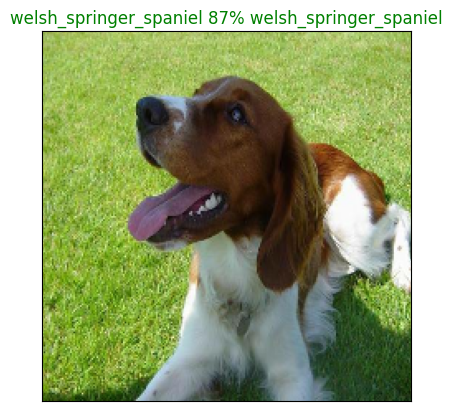

In [73]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images
          ,n=20)

Now we got one function to visualize our models top predictions,lets make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
*Find the top 10:
    *prediction probabailities indexes
    
    *prediction probabilities values
    
    *Prediction labels

*Plot the top 10 prediction probability value and labels,colouring the true label green

In [74]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  #get the predicted label
  pred_label=get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  #find the top 10 predictions confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  #Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                    color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  #Change the color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

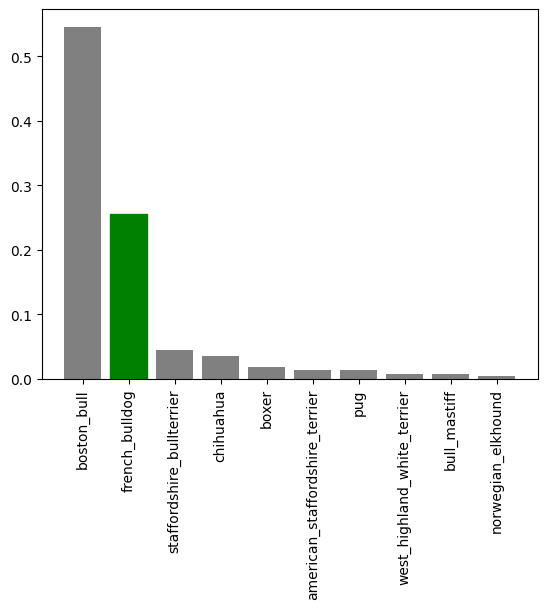

In [75]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [76]:
predictions[0]

array([7.57160378e-05, 5.43313741e-04, 1.92520639e-03, 2.52194208e-04,
       1.41142145e-05, 6.83965700e-05, 1.80675212e-04, 1.16091782e-04,
       1.99064831e-04, 2.39963367e-04, 9.83144506e-04, 1.02354947e-03,
       3.79205676e-06, 3.80265119e-04, 1.76857167e-04, 1.80932658e-03,
       2.12122584e-04, 2.39023082e-02, 7.09868793e-04, 1.12746020e-04,
       1.18846749e-03, 5.38348904e-05, 1.91215804e-04, 4.15572373e-04,
       4.83075681e-04, 5.49723409e-05, 7.76459975e-03, 1.36317220e-03,
       2.24163430e-03, 1.68552902e-03, 3.35544755e-05, 5.38724149e-03,
       3.17938770e-06, 2.32306845e-03, 1.05032334e-04, 2.17263750e-03,
       6.20833598e-04, 3.20517865e-04, 6.17401383e-05, 1.45603308e-05,
       3.69969895e-03, 3.81003891e-04, 3.62812261e-06, 5.71050076e-03,
       4.28411731e-04, 7.23187577e-06, 3.38526879e-05, 8.33617873e-04,
       2.16698004e-06, 3.68515000e-04, 4.05545543e-05, 3.35093209e-04,
       1.23317651e-02, 7.60656860e-07, 1.57684542e-03, 2.36622011e-03,
      

In [77]:
predictions[0].argsort()

array([ 53,  48,  32,  42,  12,  91,  61,  64,  45,  79,   4,  39, 104,
        30,  86,  46,  84,  76,  50,  75,  70,  85,  21, 112,  25, 107,
        90, 113,  38, 100,   5,   0,  34,  19,   7,  99,  82, 101,  14,
         6,  58,  89,  22,  73,   8,  67,  16,  62,  63,  95,   9,  74,
         3,  98, 108,  87, 102,  37,  51,  72, 119,  49,  13,  41,  23,
        44,  69,  24, 111,  60,   1, 114, 109,  88,  78,  36,  18,  47,
        56,  81,  10, 105,  11, 118,  20,  65,  27, 106,  54,  83,  29,
        77,  15,  96,  94,   2, 115,  80,  35,  68,  28,  33,  55, 110,
        40,  93,  57,  31,  43, 117, 116,  26,  71,  92,  52,  66, 103,
        17,  97,  59])

In [78]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.68489134, 0.11968371, 0.02390231, 0.01986333, 0.01716486,
       0.01233177, 0.00963871, 0.00841185, 0.0077646 , 0.00661904],
      dtype=float32)

In [79]:
predictions[0].argsort()[-10:]

array([116,  26,  71,  92,  52,  66, 103,  17,  97,  59])

In [80]:
predictions[0].max()

np.float32(0.68489134)

Now we got some functions to help us visualize our predictions and evaluate our model,lets check out a few.

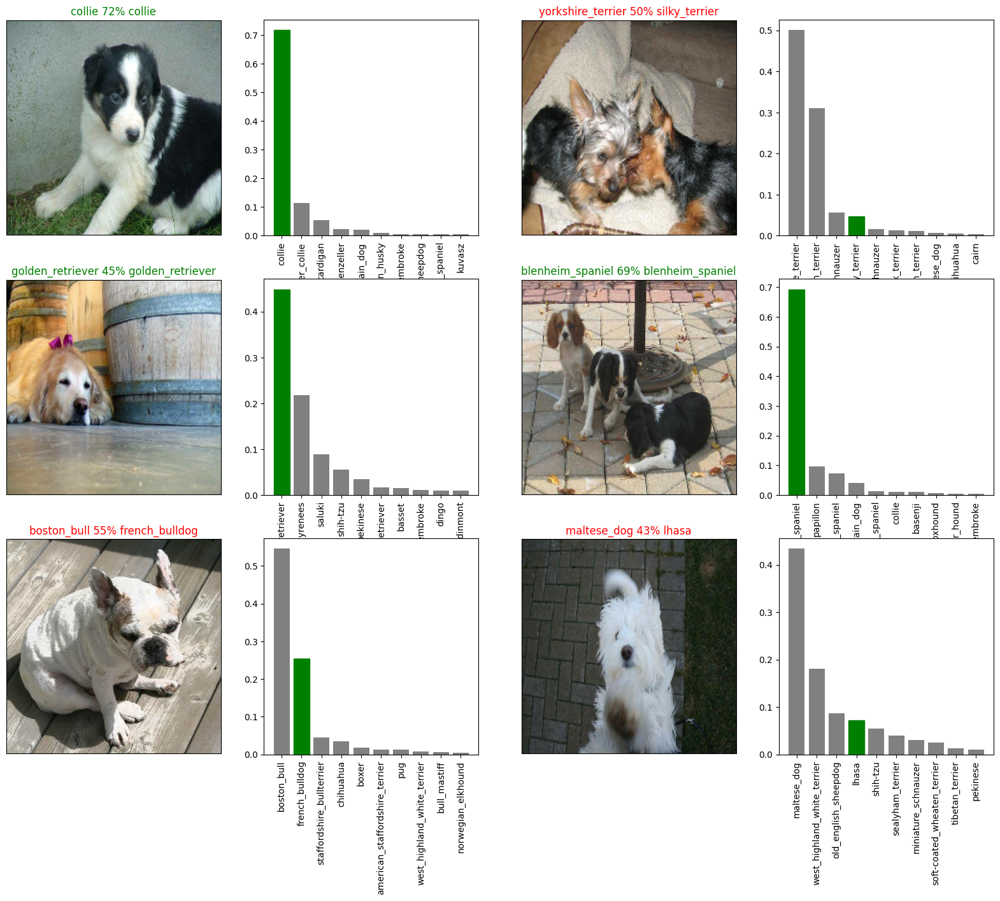

In [81]:
#Lets check out a few predictions and their different values
i_multiplier=5

num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.show()

How would we create a confusion matrix with our model predictions and true labels?

##Saving and reloading a trained model

In [82]:
#Create a function to save the model
import os
import datetime
import tensorflow as tf
import tensorflow_hub as hub

def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (string).
    Compatible with Keras 3 saving format.
    """
    # Create a model directory pathname with current time
    base_dir = "drive/MyDrive/Dog_vision/models"
    timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

    if suffix:
        base_name = f"{timestamp}-{suffix}"
    else:
        base_name = f"{timestamp}"

    # Make sure the directory exists
    os.makedirs(base_dir, exist_ok=True)

    # Full path to save the model (without extension yet)
    base_path = os.path.join(base_dir, base_name)

    # First try saving as TF SavedModel (a directory)
    tf_saved_model_path = f"{base_path}_saved_model"
    print(f"Trying to save model as TensorFlow SavedModel to: {tf_saved_model_path}...")

    try:
        # Use tf.saved_model.save directly
        tf.saved_model.save(model, tf_saved_model_path)
        print(f"Model saved successfully as TensorFlow SavedModel to {tf_saved_model_path}")
        return tf_saved_model_path
    except Exception as e:
        print(f"Error saving as SavedModel: {e}")

    # Try saving as Keras model
    keras_path = f"{base_path}.keras"
    print(f"Trying to save as Keras model to: {keras_path}...")

    try:
        model.save(keras_path)
        print(f"Model saved successfully to {keras_path}")
        return keras_path
    except Exception as e:
        print(f"Error saving as Keras model: {e}")

    # Finally try to save weights only with the correct extension
    weights_path = f"{base_path}.weights.h5"
    print(f"Attempting to save weights only to {weights_path}")

    try:
        model.save_weights(weights_path)
        print(f"Model weights saved to {weights_path}")
        return weights_path
    except Exception as e:
        print(f"Error saving weights: {e}")
        raise e

In [83]:
def load_model(model_path):
    """
    Loads a saved model from a specified path
    """
    print(f"Loading saved model from: {model_path}")

    if model_path.endswith('.weights.h5'):
        print("This is a weights-only file. You need to recreate the model architecture first.")
        return None

    if os.path.isdir(model_path) and "_saved_model" in model_path:
        print("Loading TensorFlow SavedModel...")
        try:
            model = tf.saved_model.load(model_path)
            return model
        except Exception as e:
            print(f"Error loading SavedModel: {e}")

    # Try loading as regular Keras model
    try:
        model = tf.keras.models.load_model(
            model_path,
            custom_objects={"KerasLayer": hub.KerasLayer}
        )
        return model
    except Exception as e:
        print(f"Error loading model: {e}")
        raise e

Now we have got functions to save and load a trained model,lets make sure they work!

In [84]:
#Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Trying to save model as TensorFlow SavedModel to: drive/MyDrive/Dog_vision/models/20250413-091239-1000-images-mobilenetv2-Adam_saved_model...
Error saving as SavedModel: Tried to export a function which references an 'untracked' resource. TensorFlow objects (e.g. tf.Variable) captured by functions must be 'tracked' by assigning them to an attribute of a tracked object or assigned to an attribute of the main object directly. See the information below:
	Function name = b'__inference_signature_wrapper_serving_default_60954'
	Captured Tensor = <ResourceHandle(name="MobilenetV2/Conv/weights/991", device="/job:localhost/replica:0/task:0/device:GPU:0", container="Anonymous", type="tensorflow::Var", dtype and shapes : "[ DType enum: 1, Shape: [3,3,3,40] ]")>
	Trackable referencing this tensor = <tf.Variable 'MobilenetV2/Conv/weights:0' shape=(3, 3, 3, 40) dtype=float32>
	Internal Tensor = Tensor("60428:0", shape=(), dtype=resource)
Trying to save as Keras model to: drive/MyDrive/Dog_vision/mod

'drive/MyDrive/Dog_vision/models/20250413-091239-1000-images-mobilenetv2-Adam.weights.h5'

In [85]:
#Load a trained model
loaded_1000_image_model=load_model('/content/drive/MyDrive/Dog_vision/models/20250408-124028-1000-images-mobilenetv2-Adam.weights.h5')

Loading saved model from: /content/drive/MyDrive/Dog_vision/models/20250408-124028-1000-images-mobilenetv2-Adam.weights.h5
This is a weights-only file. You need to recreate the model architecture first.


In [86]:
#Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.6695 - loss: 1.2651


[1.2956767082214355, 0.6499999761581421]

In [88]:
# Step 1: Define your model parameters with the correct output shape
INPUT_SHAPE = [224, 224, 3]
OUTPUT_SHAPE = 120  # Changed from 1001 to 120 based on the error message
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"

# Step 2: Recreate the model with the correct architecture
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Define inputs explicitly
    inputs = tf.keras.Input(shape=input_shape)

    # Use the hub module in a Lambda layer for better compatibility
    hub_layer = hub.load(model_url)
    x = tf.keras.layers.Lambda(lambda x: hub_layer(x))(inputs)

    # Add classification layer with the correct output shape
    outputs = tf.keras.layers.Dense(units=output_shape, activation="softmax")(x)

    # Create the model using the functional API
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

# Step 3: Create the model with the correct output shape
recreated_model = create_model(INPUT_SHAPE, OUTPUT_SHAPE, MODEL_URL)

# Step 4: Load the weights
weights_path = "/content/drive/MyDrive/Dog_vision/models/20250413-091239-1000-images-mobilenetv2-Adam.weights.h5"
recreated_model.load_weights(weights_path)

# Step 5: Now you can evaluate the model
loaded_1000_image_model = recreated_model
results = loaded_1000_image_model.evaluate(val_data)
print(f"Validation loss: {results[0]:.4f}")
print(f"Validation accuracy: {results[1]:.4f}")

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 368ms/step - accuracy: 0.6695 - loss: 1.2651
Validation loss: 1.2957
Validation accuracy: 0.6500


In [89]:
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.6695 - loss: 1.2651


[1.2956767082214355, 0.6499999761581421]

#Training a big dog model (on the full data)

In [90]:
len(x),len(y)

(10222, 10222)

In [91]:
#Create a data batch with the full data set
full_data=create_data_batches(x,y)

Creating training data batches....


In [92]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [93]:
#Create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4


In [94]:
#Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()

#No validation set when training on all the data,so we cant monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

Running the cell below will take a little while(maybe upto 30 minutes for the first epoch) because the GPU we are using in the runtime has to load all of the images into memory.

In [95]:
#Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/callbacks/tensorboard.py:680: UserWarning: Model failed to serialize as JSON. Ignoring... Cannot serialize object <tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject object at 0x79f878384bd0> of type <class 'tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject'>. To be serializable, a class must implement the `get_config()` method.
  warnings.warn(f"Model failed to serialize as JSON. Ignoring... {exc}")


320/320 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.5221 - loss: 2.1852
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - accuracy: 0.8952 - loss: 0.3803
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9424 - loss: 0.2272
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - accuracy: 0.9743 - loss: 0.1361
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step - accuracy: 0.9881 - loss: 0.0961
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - accuracy: 0.9947 - loss: 0.0661
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step - accuracy: 0.9950 - loss: 0.0522
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step - accuracy: 0.9980 - loss: 0.0380
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step - accuracy: 0.9978 - loss: 0.0328
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step - accuracy: 0.9987 - loss: 0.0253
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - accuracy: 0.9990 - loss: 0.0214
Epoch 12/100
320/320 ━━━━━━━━━━

In [96]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")      #17 epochs

Trying to save model as TensorFlow SavedModel to: drive/MyDrive/Dog_vision/models/20250413-092217-full-image-set-mobilenetv2-Adam_saved_model...
Error saving as SavedModel: Tried to export a function which references an 'untracked' resource. TensorFlow objects (e.g. tf.Variable) captured by functions must be 'tracked' by assigning them to an attribute of a tracked object or assigned to an attribute of the main object directly. See the information below:
	Function name = b'__inference_signature_wrapper_serving_default_203983'
	Captured Tensor = <ResourceHandle(name="MobilenetV2/Conv/weights/1872", device="/job:localhost/replica:0/task:0/device:GPU:0", container="Anonymous", type="tensorflow::Var", dtype and shapes : "[ DType enum: 1, Shape: [3,3,3,40] ]")>
	Trackable referencing this tensor = <tf.Variable 'MobilenetV2/Conv/weights:0' shape=(3, 3, 3, 40) dtype=float32>
	Internal Tensor = Tensor("203457:0", shape=(), dtype=resource)
Trying to save as Keras model to: drive/MyDrive/Dog_visi

'drive/MyDrive/Dog_vision/models/20250413-092217-full-image-set-mobilenetv2-Adam.weights.h5'

In [97]:
#Load in the full model
import tensorflow as tf
import tensorflow_hub as hub

# Define the correct parameters for your model
INPUT_SHAPE = [224, 224, 3]
OUTPUT_SHAPE = 120  # Using 120 classes as determined earlier
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"

# Function to load a model from weights
def load_from_weights(weights_path, input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print(f"Recreating model architecture and loading weights from: {weights_path}")

    # Create model with same architecture
    inputs = tf.keras.Input(shape=input_shape)

    # Use the hub module in a Lambda layer
    hub_layer = hub.load(model_url)
    x = tf.keras.layers.Lambda(lambda x: hub_layer(x))(inputs)

    # Add classification layer
    outputs = tf.keras.layers.Dense(units=output_shape, activation="softmax")(x)

    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Load weights
    try:
        model.load_weights(weights_path)
        print("Weights loaded successfully!")
    except Exception as e:
        print(f"Error loading weights: {e}")
        return None

    return model

# Now load your full model with the correct path
full_model_weights_path = "drive/MyDrive/Dog_vision/models/20250409-133537-full-image-set-mobilenetv2-Adam.weights.h5"
loaded_full_model = load_from_weights(full_model_weights_path)

# Test the model
if loaded_full_model is not None:
    print("Model loaded successfully and ready to use!")
    # You can now evaluate or make predictions with this model
    # results = loaded_full_model.evaluate(val_data)
    # print(f"Validation loss: {results[0]:.4f}")
    # print(f"Validation accuracy: {results[1]:.4f}")

Recreating model architecture and loading weights from: drive/MyDrive/Dog_vision/models/20250409-133537-full-image-set-mobilenetv2-Adam.weights.h5
Weights loaded successfully!
Model loaded successfully and ready to use!


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


##Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches,to make predictions on the test data,we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filename as input and conver them into Tensor batches.

To make predictions on the test data,we'll:
* Get the test image filenames
* Convert the filenames into test data batches using "create_date_batches()" and
  setting the test_data parameter to True(since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [98]:
#Load test image filenames
test_path="/content/dog_breed_data/test/"
test_filenames =[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/dog_breed_data/test/ebf3e1d5583ceff0a51a8c6a750b367b.jpg',
 '/content/dog_breed_data/test/955151be94bfd94a8aef282e15b0e819.jpg',
 '/content/dog_breed_data/test/f169ebcd375a7b6ecd252f27e3dba0a2.jpg',
 '/content/dog_breed_data/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 '/content/dog_breed_data/test/a2cf59280b2796e29bb4198d4999254f.jpg',
 '/content/dog_breed_data/test/b0997aebb85ed8b6c2e344277a9a1bc4.jpg',
 '/content/dog_breed_data/test/6bfe766709818c1c62c9ecd8a1ffae9a.jpg',
 '/content/dog_breed_data/test/2464089ba3fc5696013a7cc10e3052e1.jpg',
 '/content/dog_breed_data/test/3e4e31e79665550bfae0436db2c0f1d6.jpg',
 '/content/dog_breed_data/test/a7afea88213f22bc1501612f33f30f45.jpg']

In [99]:
len(test_filenames)

10357

In [100]:
#Create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

creating test data batches......


In [101]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOte** Calling `predict()` on our full model and passing it the test data batch will take a long time to run(about an ~1hr).

In [102]:
#Make predictions on test data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step


In [103]:
#Save predictions (Numpy array)to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog_vision/preds_array.csv",test_predictions,delimiter=",")

In [104]:
#Load predictions (Numpy array) from csv file

test_predictions=np.loadtxt("/content/drive/MyDrive/Dog_vision/preds_array.csv",delimiter=",")

In [105]:
test_predictions[:10]

array([[5.96302755e-07, 7.88600209e-06, 4.71070756e-08, ...,
        1.14844966e-07, 8.10150414e-06, 1.33848545e-07],
       [2.91283477e-08, 6.81048550e-06, 1.87207917e-07, ...,
        1.09686503e-07, 2.19861818e-08, 1.07653575e-08],
       [3.12957536e-06, 3.24321481e-09, 7.63370792e-07, ...,
        2.25371188e-08, 5.26060433e-07, 6.43628743e-03],
       ...,
       [6.87068837e-13, 6.86821622e-08, 2.47311993e-09, ...,
        6.79335756e-07, 7.34860039e-09, 1.39810732e-11],
       [1.99826863e-10, 3.86300769e-09, 4.21288782e-09, ...,
        4.87956839e-08, 1.13164070e-07, 1.69512349e-09],
       [1.18772661e-07, 1.50538725e-07, 2.34962414e-08, ...,
        5.75134254e-06, 2.61296492e-07, 4.27936939e-08]])

In [106]:
test_predictions.shape

(10357, 120)

##Preparing the test dataset predictions for kaggle

Looking at the kaggle sample submission,we find that it wants our model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format,we'll:
*Create a pandas DataFrame with an ID column as well as acolumn for each dog breed

*Add data to the ID column as well as a column for each dog breed.

*Add data(the prediction probabilities) to each of the dog breed columns.

*Export the DataFrame as a CSV to submit it to kaggle.

In [107]:
#Create a pandas DataFrame with empty columns
preds_df=pd.DataFrame(columns=["id"] + list(unique_breeds))

preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [108]:
#Appennd test image ID's to prediction DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [109]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ebf3e1d5583ceff0a51a8c6a750b367b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,955151be94bfd94a8aef282e15b0e819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f169ebcd375a7b6ecd252f27e3dba0a2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1dd78810048dc387573f2ec50e4bb16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,a2cf59280b2796e29bb4198d4999254f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [110]:
#add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ebf3e1d5583ceff0a51a8c6a750b367b,5.963028e-07,7.886002e-06,4.710708e-08,3.229142e-10,2.926374e-06,7.087446e-05,9.181270e-09,4.396760e-07,2.057168e-10,...,3.851312e-07,1.892712e-07,6.275886e-08,4.751260e-04,1.955991e-07,3.367372e-09,7.285445e-07,1.148450e-07,8.101504e-06,1.338485e-07
1,955151be94bfd94a8aef282e15b0e819,2.912835e-08,6.810486e-06,1.872079e-07,6.652426e-09,1.946531e-06,1.574244e-06,2.491939e-09,1.718400e-09,1.387134e-04,...,1.664530e-07,6.111835e-08,2.053294e-07,1.907040e-06,1.174052e-07,3.716479e-04,1.177171e-07,1.096865e-07,2.198618e-08,1.076536e-08
2,f169ebcd375a7b6ecd252f27e3dba0a2,3.129575e-06,3.243215e-09,7.633708e-07,4.337010e-10,1.859549e-03,3.954760e-09,4.947815e-06,1.015141e-06,2.064089e-10,...,1.793265e-06,2.232092e-07,2.670455e-08,1.501395e-09,8.013831e-09,9.196420e-10,9.813418e-01,2.253712e-08,5.260604e-07,6.436287e-03
3,e1dd78810048dc387573f2ec50e4bb16,6.891458e-06,1.109943e-07,3.822386e-08,5.007167e-10,4.756625e-09,4.075741e-09,7.059867e-07,4.502426e-09,1.245846e-08,...,7.147078e-04,9.473148e-07,1.170218e-06,7.844248e-09,5.764506e-08,4.617129e-11,4.305163e-06,5.478075e-07,3.752551e-05,1.193902e-06
4,a2cf59280b2796e29bb4198d4999254f,9.900118e-08,4.580759e-09,2.247028e-07,9.889776e-08,2.866979e-03,1.271843e-05,7.881309e-09,9.664562e-09,1.707642e-09,...,3.602485e-07,7.687229e-07,1.809529e-04,3.025395e-08,2.487605e-04,1.456562e-09,4.568352e-09,3.079024e-07,3.600010e-08,1.152023e-07


In [111]:
#Save our prediction dataframe to CSV for submission to kaggle
preds_df.to_csv("drive/MyDrive/Dog_vision/full_model_predictions_submission_1_mobilenetv2.csv",index=False)

##Making predictions on custom images
To make predictions on custom images,we'll:

* Get the filepaths of our own images.

* Turn the filepaths into data batches using `create_data_batches()`.And since our custom images won't have labels, we set the `test_data` parameter to `True`.

* Pass the custom image data batch to our model's `predict()` method.

* Convert the prediction output probabilities to predictions labels.

* Compare the predicted labels to the custom images.

In [124]:
#Get custom image filepaths
custom_path="drive/MyDrive/Dog_vision/my-dog-photos/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]

In [125]:
custom_image_paths

['drive/MyDrive/Dog_vision/my-dog-photos/0a70f64352edfef4c82c22015f0e3a20.jpg',
 'drive/MyDrive/Dog_vision/my-dog-photos/0a5f744c5077ad8f8d580081ba599ff5.jpg',
 'drive/MyDrive/Dog_vision/my-dog-photos/0b6c5bc46b7a0e29cddfa45b0b786d09.jpg',
 'drive/MyDrive/Dog_vision/my-dog-photos/0a896d2b3af617df543787b571e439d8.jpg']

In [126]:
#Turn Custom images into batch datasets
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

creating test data batches......


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [127]:
#Make predictions on the custom data
custom_preds=loaded_full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [128]:
custom_preds.shape

(4, 120)

In [129]:
#Get custom image prediction label(s
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range (len(custom_preds)) ]
custom_pred_labels

['west_highland_white_terrier', 'redbone', 'cocker_spaniel', 'leonberg']

In [132]:
#Get custom images (Our unbatchify() function won't work since ther aren't labels...)
custom_images=[]
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

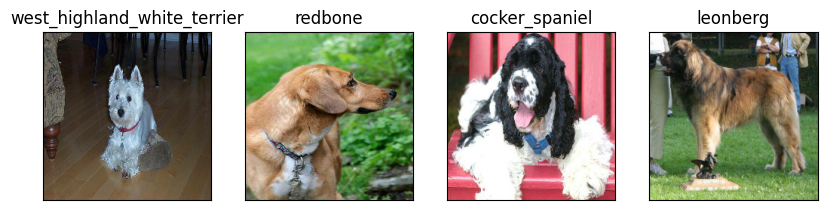

In [134]:
#Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)